In [35]:
!pip install eli5 shap catboost

In [73]:
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import datasets

# ML
from sklearn.svm import SVC, SVR
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor

# ensemble(bagging)
from sklearn.ensemble import ( 
  BaggingClassifier, BaggingRegressor, RandomForestClassifier, RandomForestRegressor
)

#ensemble(boosting)
import xgboost as xgb
import lightgbm as lgb
import catboost as cb

#stacking
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import StackingClassifier, StackingRegressor

# 평가
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, roc_curve, classification_report

# 교차검증
from sklearn.model_selection import (
  KFold, StratifiedKFold, RepeatedStratifiedKFold, cross_val_score, GridSearchCV, train_test_split
)

# Feature Selection
from sklearn.feature_selection import RFE, RFECV

# 시각화(SVM은 회귀계수가 나오지 않습니다.)
import eli5
from eli5.sklearn import PermutationImportance
import shap

# 트리 시각화
import graphviz

In [37]:
rawData=pd.read_csv('/content/drive/MyDrive/멀티캠퍼스/데이터 사이언스/data/Fraud Detection/creditcard.csv')
rawData.head(2)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0


- 고객 정보는 블라인드 처리 되어있음. 
- 정상거래와 비정상거래가 레이블링 되어있음.
- 실제 거래 금액만 확인 가능

In [38]:
rawData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

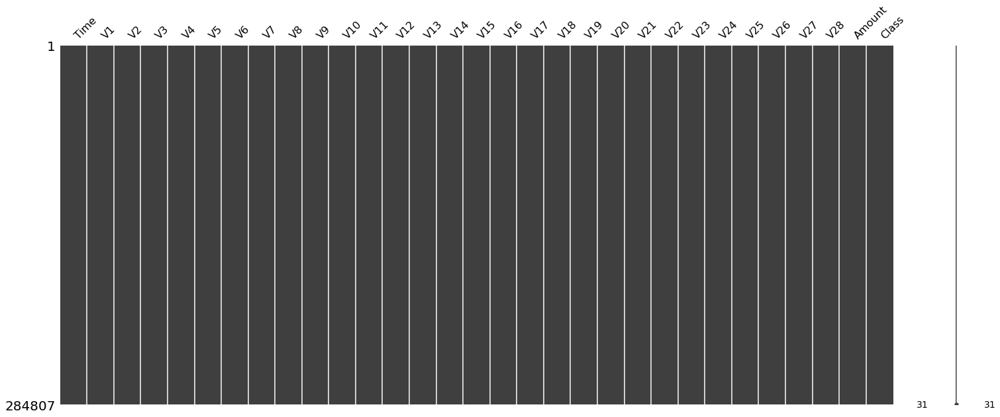

In [ ]:
import missingno
missingno.matrix( rawData ) # 결측치 확인

In [ ]:
rawData.shape

(284807, 31)

결측치 x, 전체 자료 개수는 28만 개 정도, 변수 개수 30

# EDA
- 자료의 분포나 내용 확인해보기
- 일단 이 자료는 불균형이 심할 수밖에 없음

In [39]:
rawData['Class'].unique() # 정상거래 / 사기거래

array([0, 1])

In [40]:
rawData['Class'].value_counts()

0    284315
1       492
Name: Class, dtype: int64

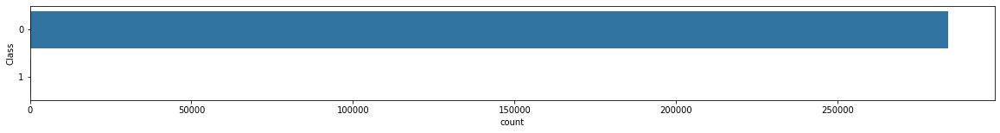

In [41]:
plt.figure(figsize=(20,2))
sns.countplot(data=rawData,y='Class')

## 자료의 분포


In [42]:
def makeCorr(x, width=15, height=7):
  plt.figure( figsize=(width, height) )
  mask = np.zeros_like(x.corr(), dtype=np.bool)
  mask[np.triu_indices_from(mask)] = True
  sns.heatmap(x.corr(), annot=True, fmt='.2f', mask=mask, cmap='YlOrBr')
  plt.show()

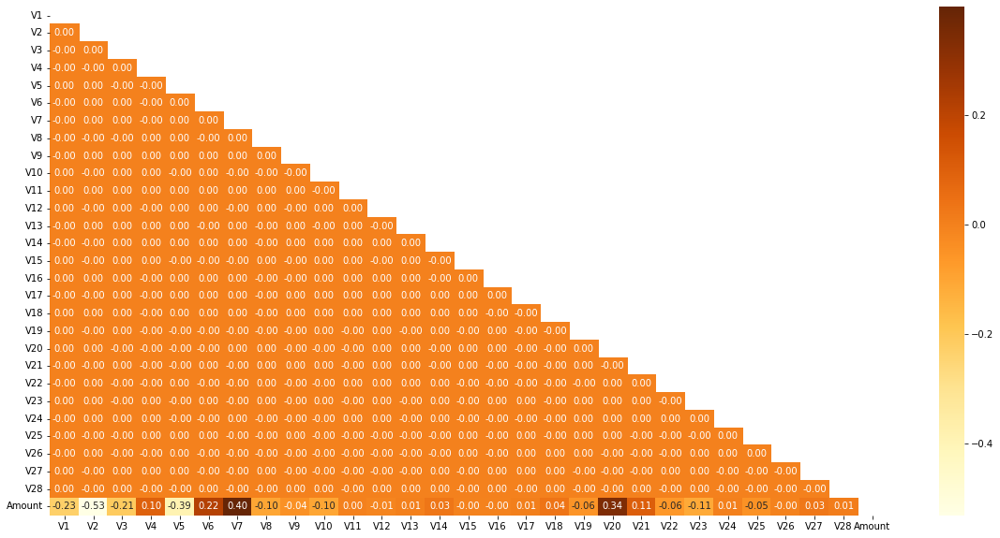

In [43]:
makeCorr(rawData.drop(columns=['Time','Class']), width=20, height=10 )

- 상관계수가 높은 변수들이 존재(v2,v7)
- 실제로 관계 있는지 확인해보기

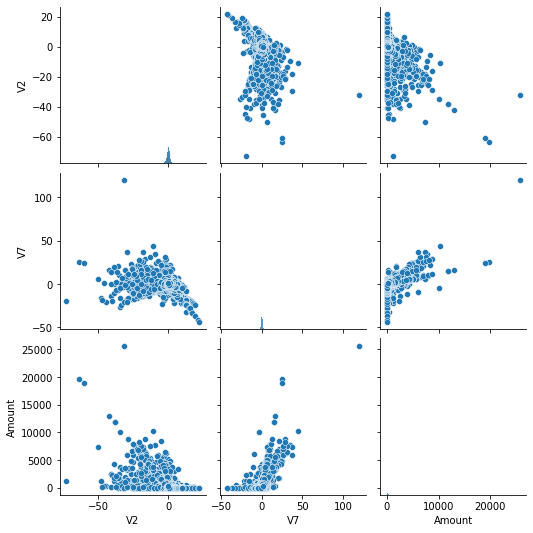

In [ ]:
sns.pairplot(rawData[['V2','V7','Amount']])

- 관계가 아예 없진 않은듯? 근데 outlier들이 보임
- outlier들이 정말 이상치가 되는지?
- 거래금액(Amount) 변수가 실제 사기거래와 관계가 있다면 저 이상치들이 분석의 대상

전체 데이터들이 정말 관계가 없는지 확인해보기

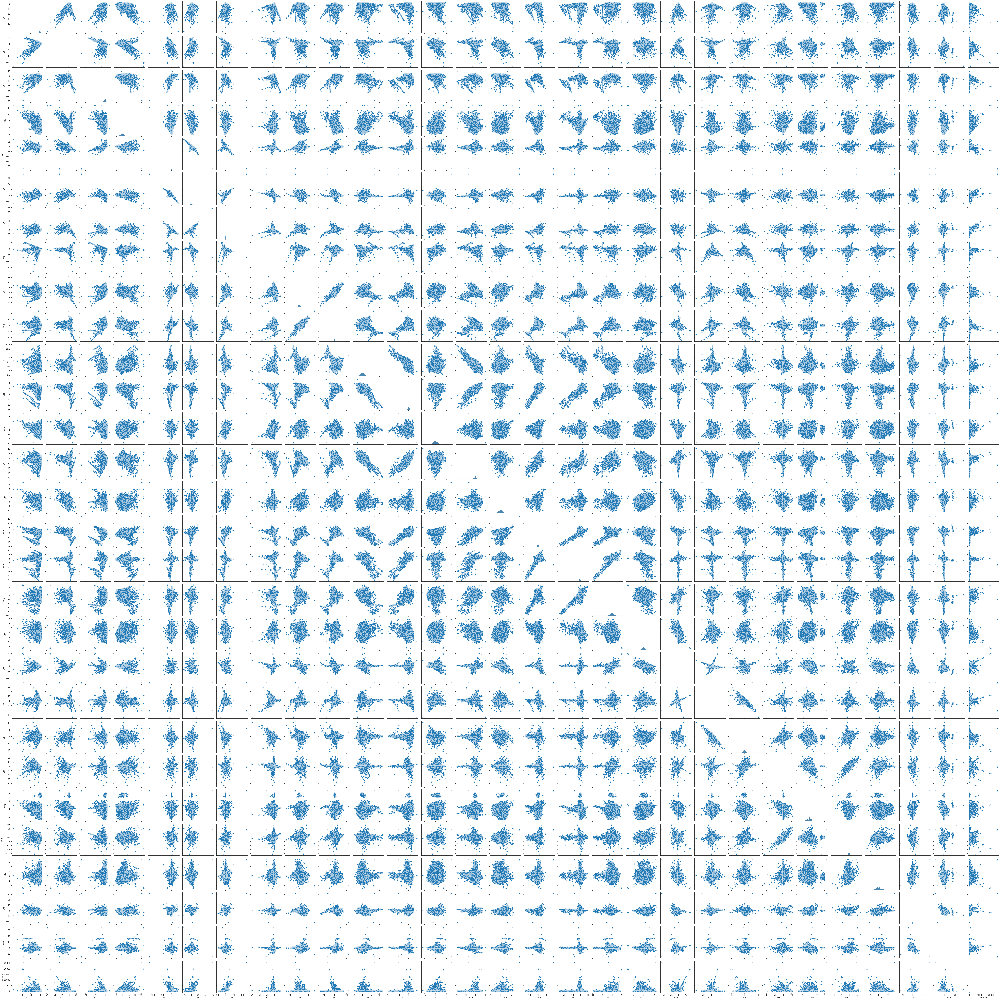

In [ ]:
# sns.pairplot(rawData.drop(columns=['Time','Class']))

## 자료의 관계 (Y에 미치는 영향)

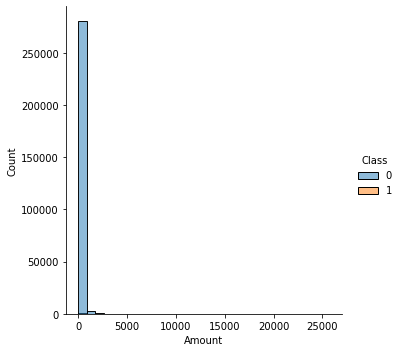

In [44]:
sns.displot( data=rawData, x='Amount', hue='Class', bins=30)

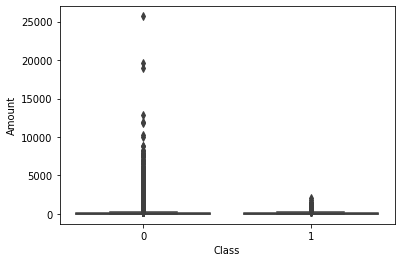

In [45]:
sns.boxplot(data=rawData,x='Class',y='Amount')

사기거래가 오히려 낮은 거래금액으로 보여짐

나머지 V1 ~ V28 까지는 확인을 해봐야 합니다.


1. 영향력이 클 것같은 변수

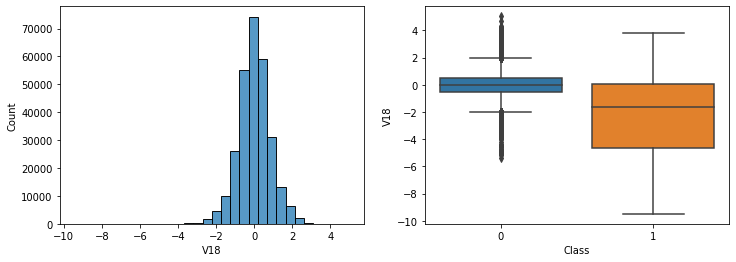

In [46]:
col_name = 'V18'
fig, ax = plt.subplots(1, 2, figsize=(12,4))
sns.histplot( data=rawData, x=col_name, bins=30, ax=ax[0])
sns.boxplot( data=rawData, x='Class', y=col_name, ax=ax[1])

2. 영향력이 없을 것같은 변수
- V6, V8, V13, V15, V20 ~ 28

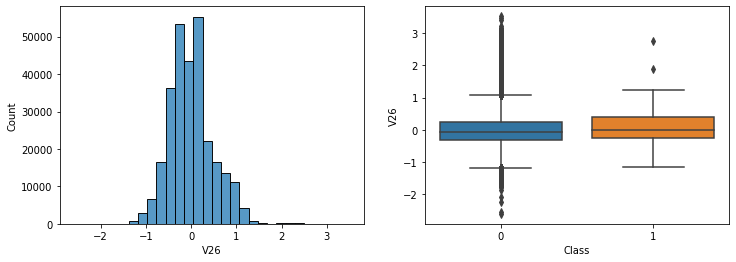

In [47]:
col_name = 'V26'
fig, ax = plt.subplots(1, 2, figsize=(12,4))
sns.histplot( data=rawData, x=col_name, bins=30, ax=ax[0])
sns.boxplot( data=rawData, x='Class', y=col_name, ax=ax[1])

# 모델링 -1
- 전체 변수를 이용

## Base Model
- 일반화 선형모델 사용

In [25]:
x = rawData.drop( columns=['Time', 'Class'])
y = rawData['Class']

In [31]:
x_train, x_validation, y_train, y_validation = train_test_split( x, y, train_size=0.7, shuffle=True)

In [27]:
folds=StratifiedKFold(n_splits=10, shuffle=True)

In [28]:
model = LogisticRegression()

params = dict(
  penalty = ['elasticnet', 'none'], 
  C = [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0],
  class_weight = ['balanced', None],
  solver = ['saga'],
  l1_ratio = [0.0, 0.3, 0.5, 0.8, 1.0]
)

search=GridSearchCV(model, param_grid=params, cv=folds,scoring='roc_auc')
search.fit(x_train,y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=True),
             estimator=LogisticRegression(),
             param_grid={'C': [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0,
                               1000.0],
                         'class_weight': ['balanced', None],
                         'l1_ratio': [0.0, 0.3, 0.5, 0.8, 1.0],
                         'penalty': ['elasticnet', 'none'],
                         'solver': ['saga']},
             scoring='roc_auc')

In [29]:
print(search.best_params_)
best_model = search.best_estimator_

{'C': 0.0001, 'class_weight': 'balanced', 'l1_ratio': 1.0, 'penalty': 'elasticnet', 'solver': 'saga'}


In [32]:
yhat_train = best_model.predict(x_train)
yhat_validation = best_model.predict(x_validation)

학습 정확도

In [33]:
print( classification_report( y_train, yhat_train) )

              precision    recall  f1-score   support

           0       1.00      0.82      0.90    198998
           1       0.01      0.92      0.02       366

    accuracy                           0.82    199364
   macro avg       0.50      0.87      0.46    199364
weighted avg       1.00      0.82      0.90    199364



검증 정확도

In [34]:
print( classification_report( y_validation, yhat_validation) )

              precision    recall  f1-score   support

           0       1.00      0.82      0.90     85317
           1       0.01      0.91      0.01       126

    accuracy                           0.82     85443
   macro avg       0.50      0.87      0.46     85443
weighted avg       1.00      0.82      0.90     85443



기본 파라미터로 진행해보기

In [48]:
model = LogisticRegression().fit(x_train, y_train)

In [49]:
yhat_train = model.predict(x_train)
yhat_validation = model.predict(x_validation)

학습정확도
=0.79
- f1 score 값 확인
- 1을 1로 분류하는 값

In [50]:
print( classification_report( y_train, yhat_train) )

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    198998
           1       0.92      0.69      0.79       366

    accuracy                           1.00    199364
   macro avg       0.96      0.85      0.89    199364
weighted avg       1.00      1.00      1.00    199364



검증정확도
=0.71
- f1 score 값 확인
- 1을 1로 판단하는 값

In [51]:
print( classification_report( y_validation, yhat_validation) )

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85317
           1       0.79      0.64      0.71       126

    accuracy                           1.00     85443
   macro avg       0.90      0.82      0.86     85443
weighted avg       1.00      1.00      1.00     85443



# 샘플링
- 자료의 비가 맞지 않는 경우
1. 적은 분류의 데이터를 많은 분류에 맞춰서 늘리기
2. 많은 클래스의 데이터를 적은 클래스에 맞춰서 줄이기


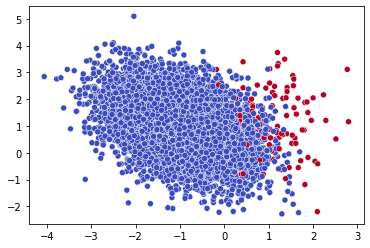

In [52]:
x, y = datasets.make_classification(
  n_samples = 10000, n_features = 2, random_state = 20210723,
  n_redundant = 0, n_clusters_per_class=1, weights=[0.99], flip_y = 0
)
sns.scatterplot(x = x[:,0], y = x[:, 1], c=y, cmap='coolwarm')

In [53]:
np.unique(y,return_counts=True)

(array([0, 1]), array([9900,  100]))

## 오버 샘플링
- 비율이 적은 클래스의 자료를 늘리는 방법
- 단순 복붙해서 늘리는 방법을 사용함

In [54]:
from imblearn.over_sampling import SMOTE, RandomOverSampler

In [55]:
sample = RandomOverSampler()
x_over_random, y_over_random = sample.fit_resample(x, y)
np.unique(y_over_random, return_counts=True)

(array([0, 1]), array([9900, 9900]))

SMOTE
- KNN 응용
- 소수의 클래스 사이에서 KNN 이용해 새로운 데이터 생성

In [56]:
sample = SMOTE()
x_over_smote, y_over_smote = sample.fit_resample(x, y)
np.unique(y_over_smote, return_counts=True)

(array([0, 1]), array([9900, 9900]))

## 언더샘플링
- 다수의 클래스의 자료를 소수의 클래스에 맞춰서 줄이기
- 랜덤하게 삭제. 근데 의외로 효과 좋음;

In [57]:
from imblearn.under_sampling import *

In [58]:
sample = RandomUnderSampler()
x_under_random, y_under_random = sample.fit_resample(x, y)
np.unique(y_under_random, return_counts=True)

(array([0, 1]), array([100, 100]))

토맥링크
- 다수의 클래스와 소수 클래스가 붙어 있는 경우가 토맥링크
- 이 자료들을  찾아서 다수의 자료를 줄이는 방법

In [59]:
sample = TomekLinks()
x_under_tomek, y_under_tomek = sample.fit_resample(x, y)
np.unique(y_under_tomek, return_counts=True)

(array([0, 1]), array([9872,  100]))

KNN 응용

In [60]:
sample = CondensedNearestNeighbour()
x_under_cnn, y_under_cnn = sample.fit_resample(x, y)
np.unique(y_under_cnn, return_counts=True)

(array([0, 1]), array([179, 100]))

ENN
- KNN 응용
- 소수의 클래스 주변만 삭제
- 그치만 지금 데이터는 잘 안 섞여 있기 때문에 의미가 없어보임

In [61]:
sample = EditedNearestNeighbours()
x_under_enn, y_under_enn = sample.fit_resample(x, y)
np.unique(y_under_enn, return_counts=True)

(array([0, 1]), array([9780,  100]))

one sided selection
- 토맥링크 + CNN

In [62]:
sample = OneSidedSelection()
x_under_tc, y_under_tc = sample.fit_resample(x, y)
np.unique(y_under_tc, return_counts=True)

(array([0, 1]), array([7870,  100]))

## 오버 + 언더
- 소수의 자료 늘리고 다수의 자료는 줄이기

In [63]:
from imblearn.combine import *

SMOTE + ENN

In [64]:
sample = SMOTEENN()
x_smote_enn, y_smote_enn = sample.fit_resample(x, y)
np.unique(y_smote_enn, return_counts=True)

(array([0, 1]), array([9005, 9179]))

SMOTE + Tomek

In [65]:
sample = SMOTETomek()
x_smote_tomek, y_smote_tomek = sample.fit_resample(x, y)
np.unique(y_smote_tomek, return_counts=True)

(array([0, 1]), array([9739, 9739]))

전체 샘플링 방법 비교

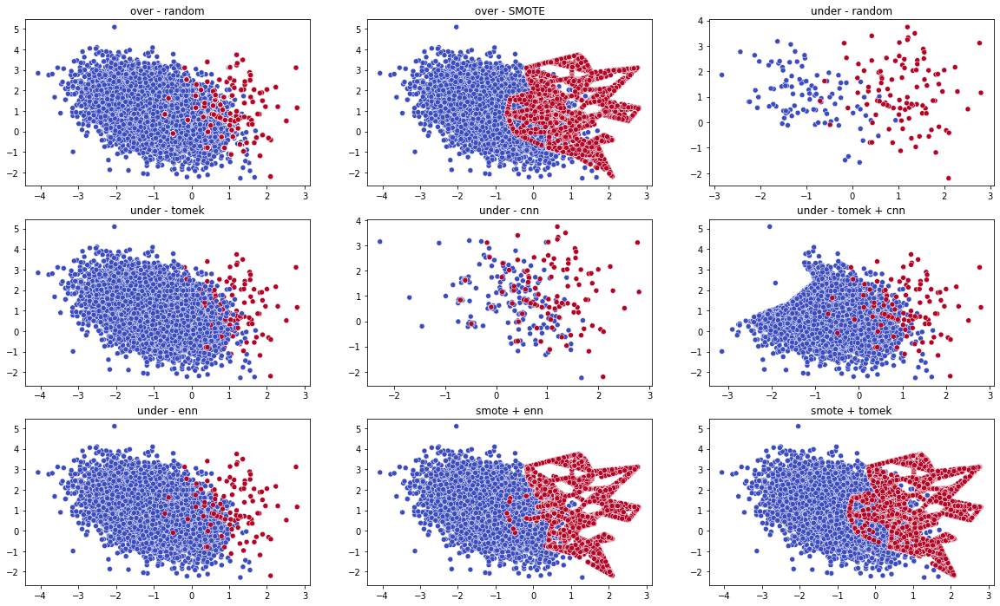

In [66]:
fig, ax = plt.subplots(3, 3, figsize=(20,12) )
ax[0,0].set_title('over - random')
sns.scatterplot(x = x_over_random[:,0], y = x_over_random[:, 1], c=y_over_random, cmap='coolwarm', ax=ax[0,0])
ax[0,1].set_title('over - SMOTE')
sns.scatterplot(x = x_over_smote[:,0], y = x_over_smote[:, 1], c=y_over_smote, cmap='coolwarm', ax=ax[0,1])
ax[0,2].set_title('under - random')
sns.scatterplot(x = x_under_random[:,0], y = x_under_random[:, 1], c=y_under_random, cmap='coolwarm', ax=ax[0,2])
ax[1,0].set_title('under - tomek')
sns.scatterplot(x = x_under_tomek[:,0], y = x_under_tomek[:, 1], c=y_under_tomek, cmap='coolwarm', ax=ax[1,0])
ax[1,1].set_title('under - cnn')
sns.scatterplot(x = x_under_cnn[:,0], y = x_under_cnn[:, 1], c=y_under_cnn, cmap='coolwarm', ax=ax[1,1])
ax[1,2].set_title('under - tomek + cnn')
sns.scatterplot(x = x_under_tc[:,0], y = x_under_tc[:, 1], c=y_under_tc, cmap='coolwarm', ax=ax[1,2])
ax[2,0].set_title('under - enn')
sns.scatterplot(x = x_under_enn[:,0], y = x_under_enn[:, 1], c=y_under_enn, cmap='coolwarm', ax=ax[2,0])
ax[2,1].set_title('smote + enn')
sns.scatterplot(x = x_smote_enn[:,0], y = x_smote_enn[:, 1], c=y_smote_enn, cmap='coolwarm', ax=ax[2,1])
ax[2,2].set_title('smote + tomek')
sns.scatterplot(x = x_smote_tomek[:,0], y = x_smote_tomek[:, 1], c=y_smote_tomek, cmap='coolwarm', ax=ax[2,2])

# 사기거래 샘플링

## 오버샘플링
- SMOTE

In [67]:
x = rawData.drop( columns=['Time', 'Class'])
y = rawData['Class']

In [68]:
sample = SMOTE()
x_over_smote, y_over_smote = sample.fit_resample(x, y)
np.unique(y_over_smote, return_counts=True)

(array([0, 1]), array([284315, 284315]))

샘플링이 잘 되었는지 확인
- V3, V4, V9, V10, V11, V12, V14, V16, V17, B18

In [69]:
rawData_over=pd.concat([x_over_smote, y_over_smote],axis=1)

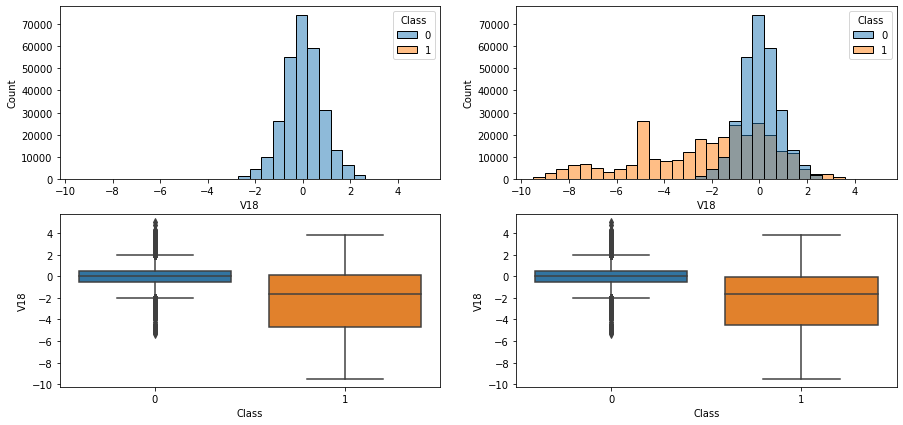

In [70]:
col_name = 'V18'
fig, ax = plt.subplots(2, 2, figsize=(15,7))
sns.histplot( data=rawData, x=col_name, bins=30, hue='Class', ax=ax[0, 0])
sns.histplot( data=rawData_over, x=col_name, bins=30, hue='Class', ax=ax[0, 1])
sns.boxplot( data=rawData, x='Class', y=col_name, ax=ax[1, 0])
sns.boxplot( data=rawData_over, x='Class', y=col_name, ax=ax[1, 1])

## 언더샘플링
- 랜덤

In [71]:
x = rawData.drop( columns=['Time', 'Class'])
y = rawData['Class']

In [75]:
sample = RandomUnderSampler()
x_under_random, y_under_random = sample.fit_resample(x, y)
np.unique(y_under_random, return_counts=True)

(array([0, 1]), array([492, 492]))

In [76]:
rawData_under = pd.concat( [x_under_random, y_under_random ], axis=1 )

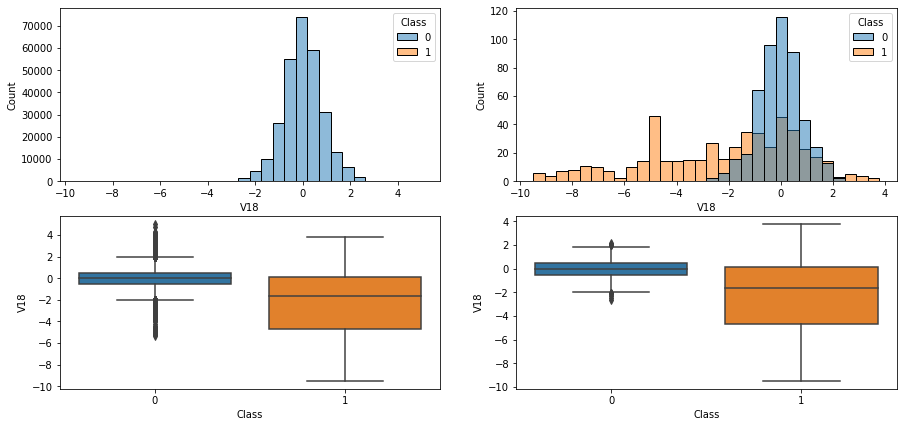

In [77]:
col_name = 'V18'
fig, ax = plt.subplots(2, 2, figsize=(15,7))
sns.histplot( data=rawData, x=col_name, bins=30, hue='Class', ax=ax[0, 0])
sns.histplot( data=rawData_under, x=col_name, bins=30, hue='Class', ax=ax[0, 1])
sns.boxplot( data=rawData, x='Class', y=col_name, ax=ax[1, 0])
sns.boxplot( data=rawData_under, x='Class', y=col_name, ax=ax[1, 1])

데이터를 삭제하니 아웃라이어들도 좀 줄어들은 효과도 있음

# 모델링 -2
- 언더샘플링 데이터를 사용

In [78]:
x_train, x_validation, y_train, y_validation = train_test_split( x_under_random, y_under_random, train_size=0.7, shuffle=True)

자료가 줄었으니 파라미터 튜닝(파인-튜닝)도 같이 해봅니다.

In [79]:
folds = StratifiedKFold( n_splits=10, shuffle=True)

In [ ]:
model = LogisticRegression()

params = dict(
  penalty = ['elasticnet', 'none'], 
  C = [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0],
  class_weight = ['balanced', None],
  solver = ['saga'],
  l1_ratio = [0.0, 0.3, 0.5, 0.8, 1.0]
)

search = GridSearchCV( model, param_grid=params, cv=folds, scoring='roc_auc')
search.fit(x_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=True),
             estimator=LogisticRegression(),
             param_grid={'C': [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0,
                               1000.0],
                         'class_weight': ['balanced', None],
                         'l1_ratio': [0.0, 0.3, 0.5, 0.8, 1.0],
                         'penalty': ['elasticnet', 'none'],
                         'solver': ['saga']},
             scoring='roc_auc')

In [ ]:
print( search.best_params_ )
best_model = search.best_estimator_

{'C': 0.1, 'class_weight': None, 'l1_ratio': 0.0, 'penalty': 'elasticnet', 'solver': 'saga'}


In [ ]:
yhat_train = best_model.predict(x_train)
yhat_validation = best_model.predict(x_validation)

학습정확도

In [ ]:
print( classification_report( y_train, yhat_train) )

              precision    recall  f1-score   support

           0       0.99      0.57      0.72       345
           1       0.70      0.99      0.82       343

    accuracy                           0.78       688
   macro avg       0.84      0.78      0.77       688
weighted avg       0.84      0.78      0.77       688



검증 정확도

In [ ]:
print( classification_report( y_validation, yhat_validation) )

              precision    recall  f1-score   support

           0       0.96      0.44      0.60       147
           1       0.64      0.98      0.77       149

    accuracy                           0.71       296
   macro avg       0.80      0.71      0.69       296
weighted avg       0.80      0.71      0.69       296



가중치 확인
- V3, V4, V9, V10, V11, V12, V14, V16, V17, B18

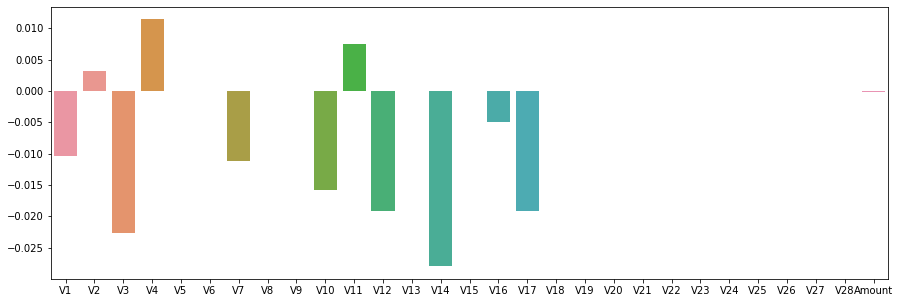

In [ ]:
plt.figure( figsize=(15, 5))
sns.barplot( x_validation.columns, best_model.coef_[0])

## 앙상블
- 랜덤 포레스트

In [ ]:
params = {
  'criterion': ['gini', 'entropy'],
  'n_estimators': [100, 300, 500, 1000],
  'max_depth': [3, 5, 7, 9, 11, 13, 15],
  'min_samples_split': [8, 16, 20],
  'min_samples_leaf': [8, 12, 18],
}

model = RandomForestClassifier()
search = GridSearchCV( model, param_grid=params, scoring='roc_auc', cv=10)
results = search.fit( x_train, y_train )

In [ ]:
print( results.best_params_ )
print( results.best_score_ )
best_model = results.best_estimator_

{'criterion': 'entropy', 'max_depth': 9, 'min_samples_leaf': 8, 'min_samples_split': 16, 'n_estimators': 300}
0.9804572417202175


In [ ]:
yhat_train = best_model.predict(x_train)
yhat_validation = best_model.predict(x_validation)

In [ ]:
print( classification_report( y_train, yhat_train) )

              precision    recall  f1-score   support

           0       0.92      1.00      0.96       345
           1       1.00      0.92      0.95       343

    accuracy                           0.96       688
   macro avg       0.96      0.96      0.96       688
weighted avg       0.96      0.96      0.96       688



앙상블 계열의 방법들은 모형의 설명력을 위해 자체적으로 변수의 중요도를 제공

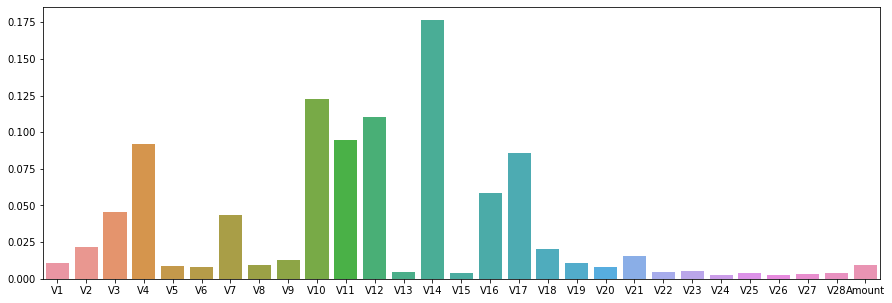

In [ ]:
plt.figure( figsize=(15,5) )
sns.barplot( x_validation.columns, best_model.feature_importances_ )

## XGBooost

In [ ]:
params = {
  'num_boost_rounds': [100, 300, 500, 1000],
  'max_depth': [3, 5, 7, 9, 11, 13, 15],
  'objective': ['binary:hinge']
}

model = xgb.XGBClassifier()
search = GridSearchCV( model, param_grid=params, scoring='roc_auc', cv=5)
results = search.fit( x_train, y_train )

In [ ]:
print( results.best_params_ )
print( results.best_score_ )
best_model = results.best_estimator_

{'max_depth': 3, 'num_boost_rounds': 100, 'objective': 'binary:hinge'}
0.9222335858875818


In [ ]:
yhat_train = best_model.predict(x_train)
yhat_validation = best_model.predict(x_validation)

In [ ]:
print( classification_report( y_train, yhat_train) )

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       352
           1       1.00      1.00      1.00       336

    accuracy                           1.00       688
   macro avg       1.00      1.00      1.00       688
weighted avg       1.00      1.00      1.00       688



In [ ]:
print( classification_report( y_validation, yhat_validation) )

              precision    recall  f1-score   support

           0       0.93      0.97      0.95       140
           1       0.97      0.93      0.95       156

    accuracy                           0.95       296
   macro avg       0.95      0.95      0.95       296
weighted avg       0.95      0.95      0.95       296



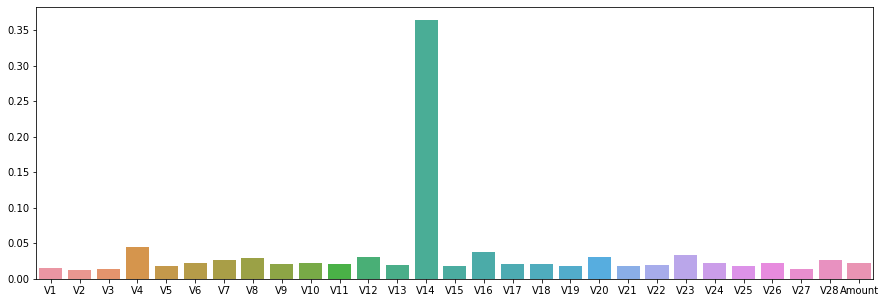

In [ ]:
plt.figure( figsize=(15,5) )
sns.barplot( x_validation.columns, best_model.feature_importances_ )

## CatBoost

In [ ]:
model = cb.CatBoostClassifier().fit(x_train, y_train)

Learning rate set to 0.008782
0:	learn: 0.6810657	total: 9.58ms	remaining: 9.57s
1:	learn: 0.6684428	total: 18.5ms	remaining: 9.21s
2:	learn: 0.6569012	total: 28.2ms	remaining: 9.38s
3:	learn: 0.6463779	total: 36.5ms	remaining: 9.1s
4:	learn: 0.6350963	total: 45.2ms	remaining: 9s
5:	learn: 0.6252831	total: 53.6ms	remaining: 8.88s
6:	learn: 0.6141975	total: 61.8ms	remaining: 8.76s
7:	learn: 0.6039562	total: 69.7ms	remaining: 8.65s
8:	learn: 0.5944401	total: 78ms	remaining: 8.59s
9:	learn: 0.5858953	total: 86.3ms	remaining: 8.54s
10:	learn: 0.5761030	total: 94.4ms	remaining: 8.49s
11:	learn: 0.5659322	total: 102ms	remaining: 8.43s
12:	learn: 0.5574097	total: 111ms	remaining: 8.4s
13:	learn: 0.5483096	total: 119ms	remaining: 8.37s
14:	learn: 0.5391663	total: 127ms	remaining: 8.33s
15:	learn: 0.5326042	total: 135ms	remaining: 8.31s
16:	learn: 0.5225736	total: 143ms	remaining: 8.29s
17:	learn: 0.5145696	total: 152ms	remaining: 8.3s
18:	learn: 0.5074377	total: 160ms	remaining: 8.27s
19:	lear

In [ ]:
yhat_train = best_model.predict(x_train)
yhat_validation = best_model.predict(x_validation)

In [ ]:
print( classification_report( y_train, yhat_train) )

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       352
           1       1.00      1.00      1.00       336

    accuracy                           1.00       688
   macro avg       1.00      1.00      1.00       688
weighted avg       1.00      1.00      1.00       688



In [ ]:
print( classification_report( y_validation, yhat_validation) )

              precision    recall  f1-score   support

           0       0.93      0.97      0.95       140
           1       0.97      0.93      0.95       156

    accuracy                           0.95       296
   macro avg       0.95      0.95      0.95       296
weighted avg       0.95      0.95      0.95       296



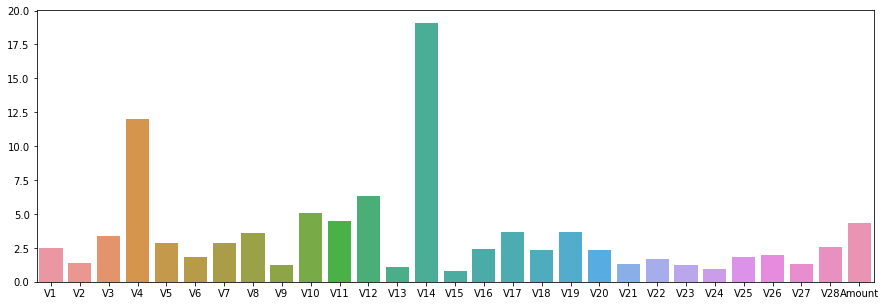

In [ ]:
plt.figure( figsize=(15,5) )
sns.barplot( x_validation.columns, model.feature_importances_ )

## 변수 선택

In [ ]:
x_under_random_selected = x_under_random[[ 'V3', 'V4', 'V9', 'V10', 'V11', 'V12', 'V14', 'V16', 'V17', 'V18'] ]

In [ ]:
x_train, x_validation, y_train, y_validation = train_test_split( x_under_random_selected, y_under_random, train_size=0.7, shuffle=True)

### 스택킹

In [ ]:
estimators = [
  ('RandomForest', RandomForestClassifier(criterion='entropy', max_depth=9, n_estimators=1000) ),
  ('XGBoost', xgb.XGBClassifier(n_estimators=1000) ), 
  ('LGBM', lgb.LGBMClassifier(n_estimators=1000) ),
  ('CB', cb.CatBoostClassifier() )
]

model = StackingClassifier( estimators=estimators, final_estimator=LogisticRegression() )
model.fit(x_train, y_train)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
4:	learn: 0.6335508	total: 74.3ms	remaining: 14.8s
5:	learn: 0.6232477	total: 92.6ms	remaining: 15.3s
6:	learn: 0.6129840	total: 102ms	remaining: 14.4s
7:	learn: 0.6022617	total: 115ms	remaining: 14.3s
8:	learn: 0.5915549	total: 131ms	remaining: 14.4s
9:	learn: 0.5822492	total: 140ms	remaining: 13.9s
10:	learn: 0.5715851	total: 154ms	remaining: 13.9s
11:	learn: 0.5609083	total: 162ms	remaining: 13.3s
12:	learn: 0.5514829	total: 178ms	remaining: 13.5s
13:	learn: 0.5438534	total: 189ms	remaining: 13.3s
14:	learn: 0.5352615	total: 206ms	remaining: 13.5s
15:	learn: 0.5273295	total: 229ms	remaining: 14.1s
16:	learn: 0.5188466	total: 240ms	remaining: 13.9s
17:	learn: 0.5115638	total: 256ms	remaining: 14s
18:	learn: 0.5033691	total: 271ms	remaining: 14s
19:	learn: 0.4945471	total: 279ms	remaining: 13.7s
20:	learn: 0.4869462	total: 289ms	remaining: 13.5s
21:	learn: 0.4800836	total: 305ms	remaining: 13.6s
22:	learn: 0.4721257	total: 313ms	remaining: 13.3s
23:

StackingClassifier(estimators=[('RandomForest',
                                RandomForestClassifier(criterion='entropy',
                                                       max_depth=9,
                                                       n_estimators=1000)),
                               ('XGBoost', XGBClassifier(n_estimators=1000)),
                               ('LGBM', LGBMClassifier(n_estimators=1000)),
                               ('CB',
                                <catboost.core.CatBoostClassifier object at 0x7fc38b885690>)],
                   final_estimator=LogisticRegression())

In [ ]:
yhat_train = model.predict(x_train)
yhat_validation = model.predict(x_validation)

In [ ]:
print( classification_report( y_train, yhat_train) )

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       344
           1       1.00      1.00      1.00       344

    accuracy                           1.00       688
   macro avg       1.00      1.00      1.00       688
weighted avg       1.00      1.00      1.00       688



In [ ]:
print( classification_report( y_validation, yhat_validation) )

              precision    recall  f1-score   support

           0       0.92      0.97      0.94       148
           1       0.96      0.91      0.94       148

    accuracy                           0.94       296
   macro avg       0.94      0.94      0.94       296
weighted avg       0.94      0.94      0.94       296

